In [1]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import pandas as pd
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from siphon.catalog import TDSCatalog
import metpy.calc as mpcalc
from metpy.units import units
from scipy.ndimage import gaussian_filter
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import time as datetime

In [7]:
def load_datasets(year, month, start_day, start_hour=0, end_day=None, end_hour=23):
    # Set end_day to start_day if not provided
    if end_day is None:
        end_day = start_day
    
    # Get the last day of the month
    last_day_of_month = pd.Timestamp(year=year, month=month, day=1) + pd.offsets.MonthEnd(1)
    last_day_str = f"{last_day_of_month.day:02d}"  # format last day as two digits

    # Format date and time strings
    year_month = f'{year}{month:02d}'
    start_time = f'{year}{month:02d}{start_day:02d}{start_hour:02d}'  # yyyymmddhh (start)
    end_time = f'{year}{month:02d}{end_day:02d}{end_hour:02d}'  # yyyymmddhh (end)

    # Define URLs for pressure level datasets with specific time ranges
    urls = {
        'temperature_pl': f'https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/{year_month}/catalog.html?dataset=files/g/d633000/e5.oper.an.pl/{year_month}/e5.oper.an.pl.128_130_t.ll025sc.{start_time}_{end_time}.nc',
        'geopotential_pl': f'https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/{year_month}/catalog.html?dataset=files/g/d633000/e5.oper.an.pl/{year_month}/e5.oper.an.pl.128_129_z.ll025sc.{start_time}_{end_time}.nc',
        'humidity_pl': f'https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/{year_month}/catalog.html?dataset=files/g/d633000/e5.oper.an.pl/{year_month}/e5.oper.an.pl.128_133_q.ll025sc.{start_time}_{end_time}.nc',
        'v_wind_pl': f'https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/{year_month}/catalog.html?dataset=files/g/d633000/e5.oper.an.pl/{year_month}/e5.oper.an.pl.128_132_v.ll025uv.{start_time}_{end_time}.nc',
        'u_wind_pl': f'https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/{year_month}/catalog.html?dataset=files/g/d633000/e5.oper.an.pl/{year_month}/e5.oper.an.pl.128_131_u.ll025uv.{start_time}_{end_time}.nc',
        'w_wind_pl': f'https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/{year_month}/catalog.html?dataset=files/g/d633000/e5.oper.an.pl/{year_month}/e5.oper.an.pl.128_135_w.ll025sc.{start_time}_{end_time}.nc',
        'pv_pl': f'https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/{year_month}/catalog.html?dataset=files/g/d633000/e5.oper.an.pl/{year_month}/e5.oper.an.pl.128_060_pv.ll025sc.{start_time}_{end_time}.nc',
        
        # Define URLs for surface datasets to cover the full month using last_day_of_month
        'mslp_sfc': f'https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.sfc/{year_month}/catalog.html?dataset=files/g/d633000/e5.oper.an.sfc/{year_month}/e5.oper.an.sfc.128_151_msl.ll025sc.{year_month}0100_{year_month}{last_day_str}23.nc',
        'u_wind_sfc': f'https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.sfc/{year_month}/catalog.html?dataset=files/g/d633000/e5.oper.an.sfc/{year_month}/e5.oper.an.sfc.228_131_u10n.ll025sc.{year_month}0100_{year_month}{last_day_str}23.nc',
        'v_wind_sfc': f'https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.sfc/{year_month}/catalog.html?dataset=files/g/d633000/e5.oper.an.sfc/{year_month}/e5.oper.an.sfc.228_132_v10n.ll025sc.{year_month}0100_{year_month}{last_day_str}23.nc',
        'temperature_sfc': f'https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.sfc/{year_month}/catalog.html?dataset=files/g/d633000/e5.oper.an.sfc/{year_month}/e5.oper.an.sfc.128_167_2t.ll025sc.{year_month}0100_{year_month}{last_day_str}23.nc',
        'dew_point_sfc': f'https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.sfc/{year_month}/catalog.html?dataset=files/g/d633000/e5.oper.an.sfc/{year_month}/e5.oper.an.sfc.128_168_2d.ll025sc.{year_month}0100_{year_month}{last_day_str}23.nc'
    }

    # Initialize empty dictionaries for datasets
    datasets = {}

    # Try to load datasets from the URLs
    for var, url in urls.items():
        try:
            tds_catalog = TDSCatalog(url)
            ds_url = tds_catalog.datasets[0].access_urls['OPENDAP']
            ds = xr.open_dataset(ds_url).metpy.parse_cf()
            datasets[var] = ds
            print(f"Successfully loaded {var}")

        except Exception as e:
            print(f"Error loading {var}: {e}")

    # Merge pressure level datasets if available
    ds_pl, ds_sfc, ds_lsm = None, None, None

    try:
        ds_pl = xr.merge([datasets['temperature_pl'], datasets['geopotential_pl'], datasets['humidity_pl'], 
                        datasets['v_wind_pl'], datasets['u_wind_pl'], datasets['w_wind_pl'], datasets['pv_pl']])
        print("Successfully merged pressure level datasets")
    except KeyError as e:
        print(f"Error merging pressure level datasets: {e}")

    # Merge surface datasets if available
    try:
        ds_sfc = xr.merge([datasets['mslp_sfc'], datasets['v_wind_sfc'], datasets['u_wind_sfc'],
                        datasets['temperature_sfc'], datasets['dew_point_sfc']])
        print("Successfully merged surface datasets")
    except KeyError as e:
        print(f"Error merging surface datasets: {e}")

    # Load the land-sea mask
    try:
        lsm_url = 'https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.invariant/197901/catalog.html?dataset=files/g/d633000/e5.oper.invariant/197901/e5.oper.invariant.128_172_lsm.ll025sc.1979010100_1979010100.nc'
        tds_catalog = TDSCatalog(lsm_url)
        ds_url = tds_catalog.datasets[0].access_urls['OPENDAP']
        ds = xr.open_dataset(ds_url).metpy.parse_cf()
        ds_lsm = ds['LSM'].isel(time=0)
        print("Successfully loaded land-sea mask")
    except Exception as e:
        print(f"Error loading land-sea mask: {e}")

    # Synchronize time dimensions
    try:
        if ds_pl is not None and ds_sfc is not None:
            first_time_pl, last_time_pl = ds_pl['time'].min().values, ds_pl['time'].max().values
            ds_sfc = ds_sfc.sel(time=slice(first_time_pl, last_time_pl))
    except KeyError as e:
        print(f"Error accessing 'time' in the datasets: {e}")
    except Exception as e:
        print(f"An error occurred during slicing: {e}")
        
    return ds_pl, ds_sfc, ds_lsm

def plot_absolute_vorticity(ds_pl, ds_sfc, ds_lsm, directions, g):
    ds_pl_sliced = ds_pl.sel(latitude=slice(directions['North']+5, directions['South']-5), longitude=slice(directions['West']-5, directions['East']+5))
    ds_sfc_sliced = ds_sfc.sel(latitude=slice(directions['North'], directions['South']), longitude=slice(directions['West'], directions['East']))
    ds_lsm_sliced = ds_lsm.sel(latitude=slice(directions['North'], directions['South']), longitude=slice(directions['West'], directions['East']))

    for i in range (0, len(ds_pl_sliced['time'])):
        # Loop over the time dimension and select the 500 hPa level 
        ds_pl_time_sliced = ds_pl_sliced.isel(time=i)
        t_sliced = ds_pl_time_sliced['T'].sel(level=500) # units: K
        u_sliced = ds_pl_time_sliced['U'].sel(level=500) # units: m/s
        v_sliced = ds_pl_time_sliced['V'].sel(level=500) # units: m/s
        z_sliced = ds_pl_time_sliced['Z'].sel(level=500) / g # units: m

        # Get lats and lons and grid spacing
        lat, lon = t_sliced['latitude'], t_sliced['longitude']
        dx, dy = mpcalc.lat_lon_grid_deltas(lon, lat)

        # Calculate absolute vorticity
        absolute_vorticity = mpcalc.absolute_vorticity(u=u_sliced, v=v_sliced, dx=dx, dy=dy) * 1e5 # units: 1/s

        # Define the color levels and colors for the isotachs
        levels = np.arange(8, 42, 2)
        colors = ['#FFFFFF','#daedfb', '#b7dcf6', '#91bae4', '#7099ce', '#6a999d', '#72ad63', '#77c14a', '#cad955', '#f8cf4f', '#f7953c', '#ef5f28', '#e13e26', '#cd1e28', '#b1181e', '#901617']
        cmap = mcolors.ListedColormap(colors)
        norm = mcolors.BoundaryNorm(levels, cmap.N)

        # Get the time of the current time step and create a pandas DatetimeIndex
        time = ds_pl_time_sliced.time.values
        int_datetime_index = pd.DatetimeIndex([time])

        # Create the figure 
        fig, ax = plt.subplots(figsize=(12, 9), subplot_kw={'projection': ccrs.PlateCarree()})

        # Plot isohyspses
        isohypses = plt.contour(lon, lat, z_sliced, colors='black', levels=np.arange(5000, 6200, 60), linewidths=1)
        try:
            plt.clabel(isohypses, inline=True, inline_spacing=5, fontsize=10, fmt='%i')
        except IndexError:
            print("No contours to label for geopotential heights.")

        # Plot absolute vorticity
        cf = plt.contourf(lon, lat, absolute_vorticity, cmap=cmap, levels=levels, norm=norm, extend='both')
        plt.colorbar(cf, orientation='horizontal', label = 'Absolute Vorticity ($10^{-5}$ s$^{-1}$)', pad=0.05, aspect=50)

        # Plot wind barbs 
        step = 15
        ax.barbs(u_sliced['longitude'][::step], u_sliced['latitude'][::step], u_sliced[::step, ::step], v_sliced[::step, ::step], length=6, color='black')

        # Legends
        isohypse_line = plt.Line2D([0], [0], color='black', linewidth=1, label='Geopotential Height (m)')
        ax.legend(handles=[isohypse_line], loc='upper right')

        # Add the title, set the map extent, and add map features
        plt.title(f'500-hPa Absolute Vorticity, Geopotential Height, and Winds | {int_datetime_index[0].strftime("%Y-%m-%d %H00 UTC")}', fontsize=14, weight='bold')
        
        # Focus on the eastern Pacific and add features
        ax.set_extent([directions['West'], directions['East'], directions['South'], directions['North']-5])
        ax.add_feature(cfeature.STATES.with_scale('50m'), edgecolor='gray', linewidth=0.5)
        ax.add_feature(cfeature.COASTLINE.with_scale('10m'), linewidth=0.5)
        ax.add_feature(cfeature.OCEAN, color='white')
        ax.add_feature(cfeature.BORDERS, linewidth=0.5)
        ax.add_feature(cfeature.LAND, color='#fbf5e9')

        # Add gridlines and format longitude/latitude labels
        gls = ax.gridlines(draw_labels=False, color='black', linestyle='--', alpha=0.35)
        gls.top_labels = False
        gls.right_labels = False
        ax.set_xticks(ax.get_xticks(), crs=ccrs.PlateCarree())
        ax.set_yticks(ax.get_yticks(), crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter()
        lat_formatter = LatitudeFormatter()
        ax.xaxis.set_major_formatter(lon_formatter)
        ax.yaxis.set_major_formatter(lat_formatter)

        plt.tight_layout()
        plt.show()

C:\Users\Tony\anaconda3\lib\site-packages\siphon\catalog.py:292: UserWarning: URL https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/201902/catalog.html?dataset=files/g/d633000/e5.oper.an.pl/201902/e5.oper.an.pl.128_130_t.ll025sc.2019021300_2019021323.nc returned HTML. Changing to: https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/201902/catalog.xml?dataset=files/g/d633000/e5.oper.an.pl/201902/e5.oper.an.pl.128_130_t.ll025sc.2019021300_2019021323.nc
  warnings.warn('URL {} returned HTML. Changing to: {}'.format(self.catalog_url,


Successfully loaded temperature_pl


C:\Users\Tony\anaconda3\lib\site-packages\siphon\catalog.py:292: UserWarning: URL https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/201902/catalog.html?dataset=files/g/d633000/e5.oper.an.pl/201902/e5.oper.an.pl.128_129_z.ll025sc.2019021300_2019021323.nc returned HTML. Changing to: https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/201902/catalog.xml?dataset=files/g/d633000/e5.oper.an.pl/201902/e5.oper.an.pl.128_129_z.ll025sc.2019021300_2019021323.nc
  warnings.warn('URL {} returned HTML. Changing to: {}'.format(self.catalog_url,


Successfully loaded geopotential_pl


C:\Users\Tony\anaconda3\lib\site-packages\siphon\catalog.py:292: UserWarning: URL https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/201902/catalog.html?dataset=files/g/d633000/e5.oper.an.pl/201902/e5.oper.an.pl.128_133_q.ll025sc.2019021300_2019021323.nc returned HTML. Changing to: https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/201902/catalog.xml?dataset=files/g/d633000/e5.oper.an.pl/201902/e5.oper.an.pl.128_133_q.ll025sc.2019021300_2019021323.nc
  warnings.warn('URL {} returned HTML. Changing to: {}'.format(self.catalog_url,


Successfully loaded humidity_pl


C:\Users\Tony\anaconda3\lib\site-packages\siphon\catalog.py:292: UserWarning: URL https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/201902/catalog.html?dataset=files/g/d633000/e5.oper.an.pl/201902/e5.oper.an.pl.128_132_v.ll025uv.2019021300_2019021323.nc returned HTML. Changing to: https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/201902/catalog.xml?dataset=files/g/d633000/e5.oper.an.pl/201902/e5.oper.an.pl.128_132_v.ll025uv.2019021300_2019021323.nc
  warnings.warn('URL {} returned HTML. Changing to: {}'.format(self.catalog_url,


Successfully loaded v_wind_pl


C:\Users\Tony\anaconda3\lib\site-packages\siphon\catalog.py:292: UserWarning: URL https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/201902/catalog.html?dataset=files/g/d633000/e5.oper.an.pl/201902/e5.oper.an.pl.128_131_u.ll025uv.2019021300_2019021323.nc returned HTML. Changing to: https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/201902/catalog.xml?dataset=files/g/d633000/e5.oper.an.pl/201902/e5.oper.an.pl.128_131_u.ll025uv.2019021300_2019021323.nc
  warnings.warn('URL {} returned HTML. Changing to: {}'.format(self.catalog_url,


Successfully loaded u_wind_pl


C:\Users\Tony\anaconda3\lib\site-packages\siphon\catalog.py:292: UserWarning: URL https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/201902/catalog.html?dataset=files/g/d633000/e5.oper.an.pl/201902/e5.oper.an.pl.128_135_w.ll025sc.2019021300_2019021323.nc returned HTML. Changing to: https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/201902/catalog.xml?dataset=files/g/d633000/e5.oper.an.pl/201902/e5.oper.an.pl.128_135_w.ll025sc.2019021300_2019021323.nc
  warnings.warn('URL {} returned HTML. Changing to: {}'.format(self.catalog_url,


Successfully loaded w_wind_pl


C:\Users\Tony\anaconda3\lib\site-packages\siphon\catalog.py:292: UserWarning: URL https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/201902/catalog.html?dataset=files/g/d633000/e5.oper.an.pl/201902/e5.oper.an.pl.128_060_pv.ll025sc.2019021300_2019021323.nc returned HTML. Changing to: https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/201902/catalog.xml?dataset=files/g/d633000/e5.oper.an.pl/201902/e5.oper.an.pl.128_060_pv.ll025sc.2019021300_2019021323.nc
  warnings.warn('URL {} returned HTML. Changing to: {}'.format(self.catalog_url,


Successfully loaded pv_pl


C:\Users\Tony\anaconda3\lib\site-packages\siphon\catalog.py:292: UserWarning: URL https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.sfc/201902/catalog.html?dataset=files/g/d633000/e5.oper.an.sfc/201902/e5.oper.an.sfc.128_151_msl.ll025sc.2019020100_2019022823.nc returned HTML. Changing to: https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.sfc/201902/catalog.xml?dataset=files/g/d633000/e5.oper.an.sfc/201902/e5.oper.an.sfc.128_151_msl.ll025sc.2019020100_2019022823.nc
  warnings.warn('URL {} returned HTML. Changing to: {}'.format(self.catalog_url,


Successfully loaded mslp_sfc


C:\Users\Tony\anaconda3\lib\site-packages\siphon\catalog.py:292: UserWarning: URL https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.sfc/201902/catalog.html?dataset=files/g/d633000/e5.oper.an.sfc/201902/e5.oper.an.sfc.228_131_u10n.ll025sc.2019020100_2019022823.nc returned HTML. Changing to: https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.sfc/201902/catalog.xml?dataset=files/g/d633000/e5.oper.an.sfc/201902/e5.oper.an.sfc.228_131_u10n.ll025sc.2019020100_2019022823.nc
  warnings.warn('URL {} returned HTML. Changing to: {}'.format(self.catalog_url,


Successfully loaded u_wind_sfc


C:\Users\Tony\anaconda3\lib\site-packages\siphon\catalog.py:292: UserWarning: URL https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.sfc/201902/catalog.html?dataset=files/g/d633000/e5.oper.an.sfc/201902/e5.oper.an.sfc.228_132_v10n.ll025sc.2019020100_2019022823.nc returned HTML. Changing to: https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.sfc/201902/catalog.xml?dataset=files/g/d633000/e5.oper.an.sfc/201902/e5.oper.an.sfc.228_132_v10n.ll025sc.2019020100_2019022823.nc
  warnings.warn('URL {} returned HTML. Changing to: {}'.format(self.catalog_url,


Successfully loaded v_wind_sfc


C:\Users\Tony\anaconda3\lib\site-packages\siphon\catalog.py:292: UserWarning: URL https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.sfc/201902/catalog.html?dataset=files/g/d633000/e5.oper.an.sfc/201902/e5.oper.an.sfc.128_167_2t.ll025sc.2019020100_2019022823.nc returned HTML. Changing to: https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.sfc/201902/catalog.xml?dataset=files/g/d633000/e5.oper.an.sfc/201902/e5.oper.an.sfc.128_167_2t.ll025sc.2019020100_2019022823.nc
  warnings.warn('URL {} returned HTML. Changing to: {}'.format(self.catalog_url,


Successfully loaded temperature_sfc


C:\Users\Tony\anaconda3\lib\site-packages\siphon\catalog.py:292: UserWarning: URL https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.sfc/201902/catalog.html?dataset=files/g/d633000/e5.oper.an.sfc/201902/e5.oper.an.sfc.128_168_2d.ll025sc.2019020100_2019022823.nc returned HTML. Changing to: https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.sfc/201902/catalog.xml?dataset=files/g/d633000/e5.oper.an.sfc/201902/e5.oper.an.sfc.128_168_2d.ll025sc.2019020100_2019022823.nc
  warnings.warn('URL {} returned HTML. Changing to: {}'.format(self.catalog_url,


Successfully loaded dew_point_sfc
Successfully merged pressure level datasets
Successfully merged surface datasets


C:\Users\Tony\anaconda3\lib\site-packages\siphon\catalog.py:292: UserWarning: URL https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.invariant/197901/catalog.html?dataset=files/g/d633000/e5.oper.invariant/197901/e5.oper.invariant.128_172_lsm.ll025sc.1979010100_1979010100.nc returned HTML. Changing to: https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.invariant/197901/catalog.xml?dataset=files/g/d633000/e5.oper.invariant/197901/e5.oper.invariant.128_172_lsm.ll025sc.1979010100_1979010100.nc
  warnings.warn('URL {} returned HTML. Changing to: {}'.format(self.catalog_url,


Successfully loaded land-sea mask


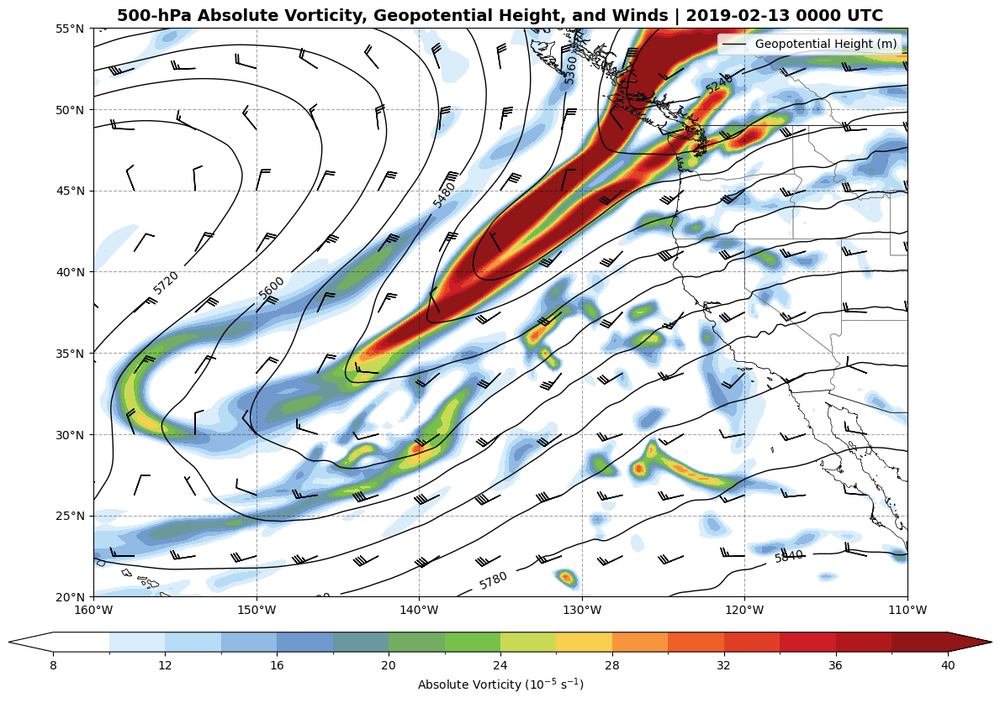

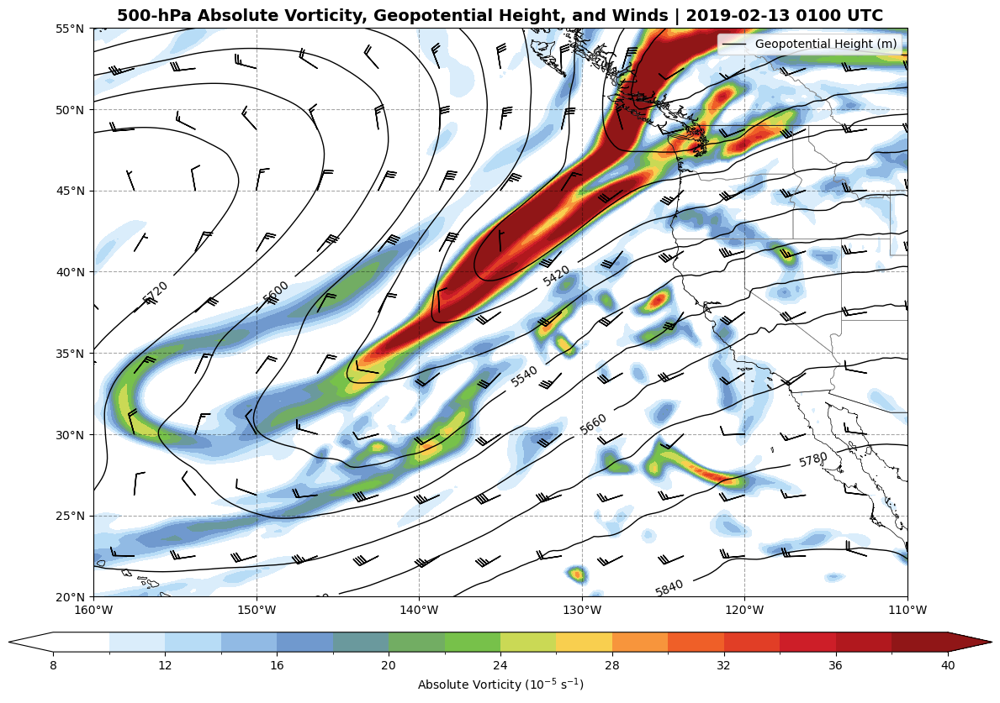

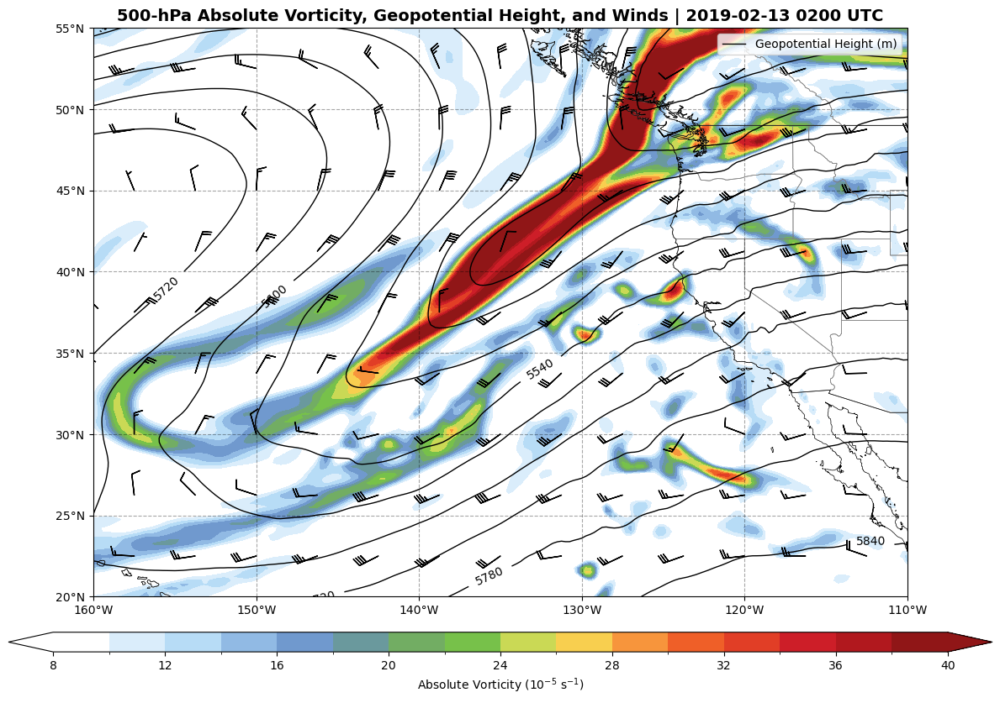

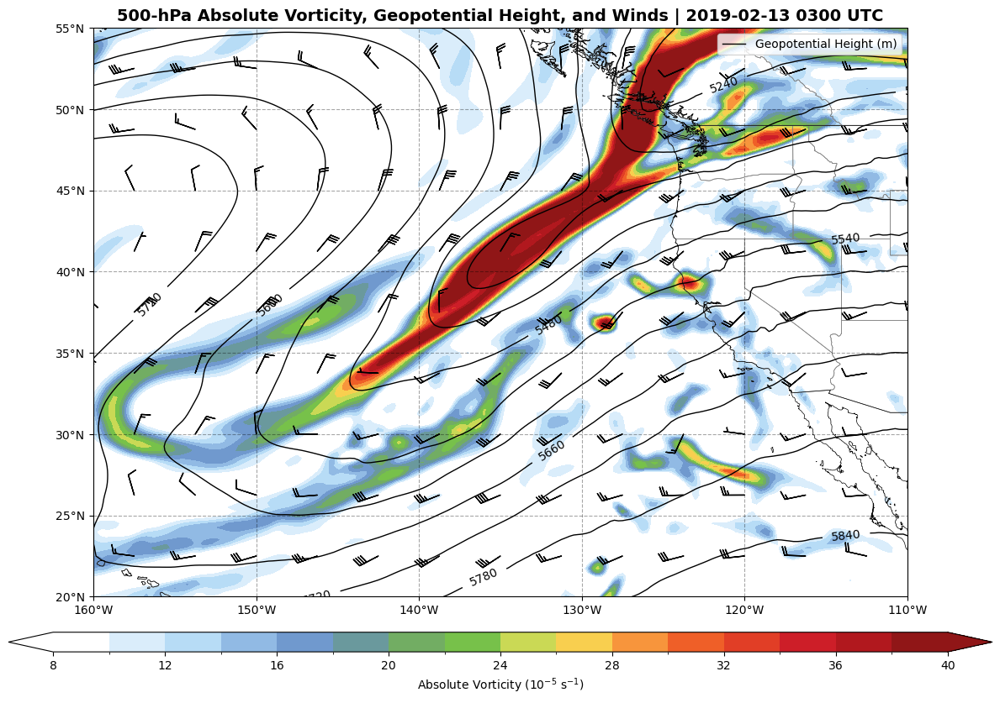

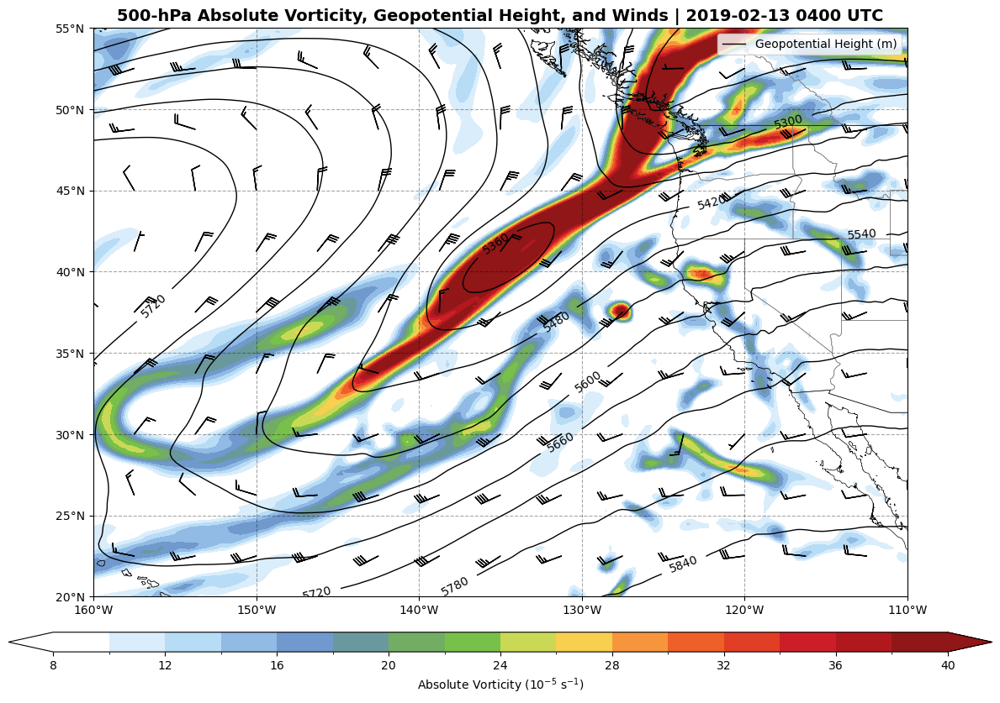

...

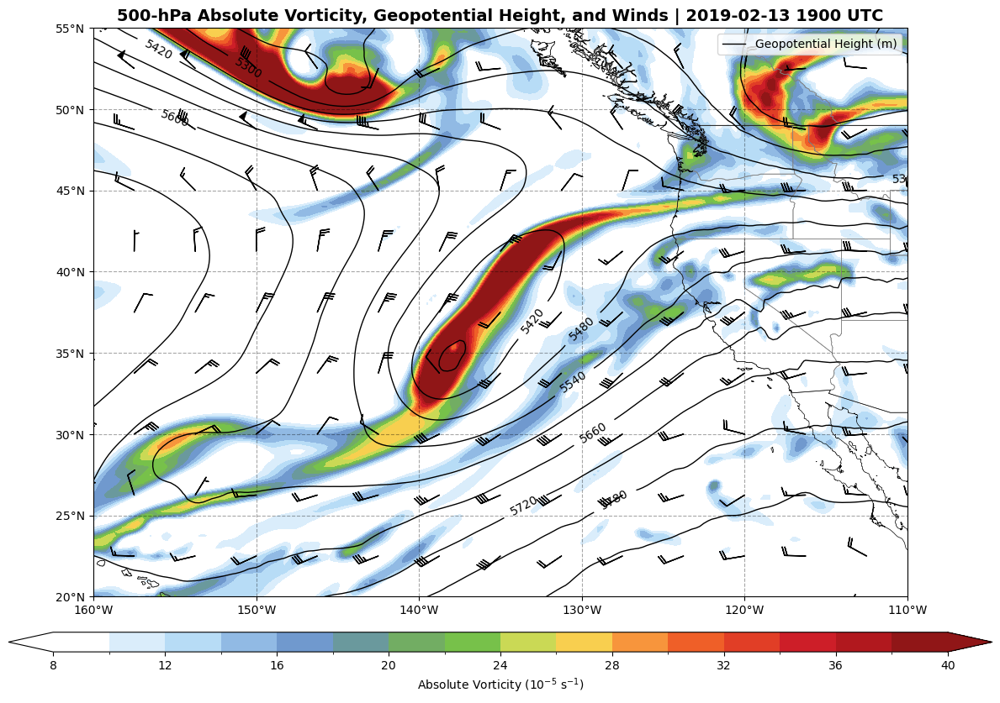

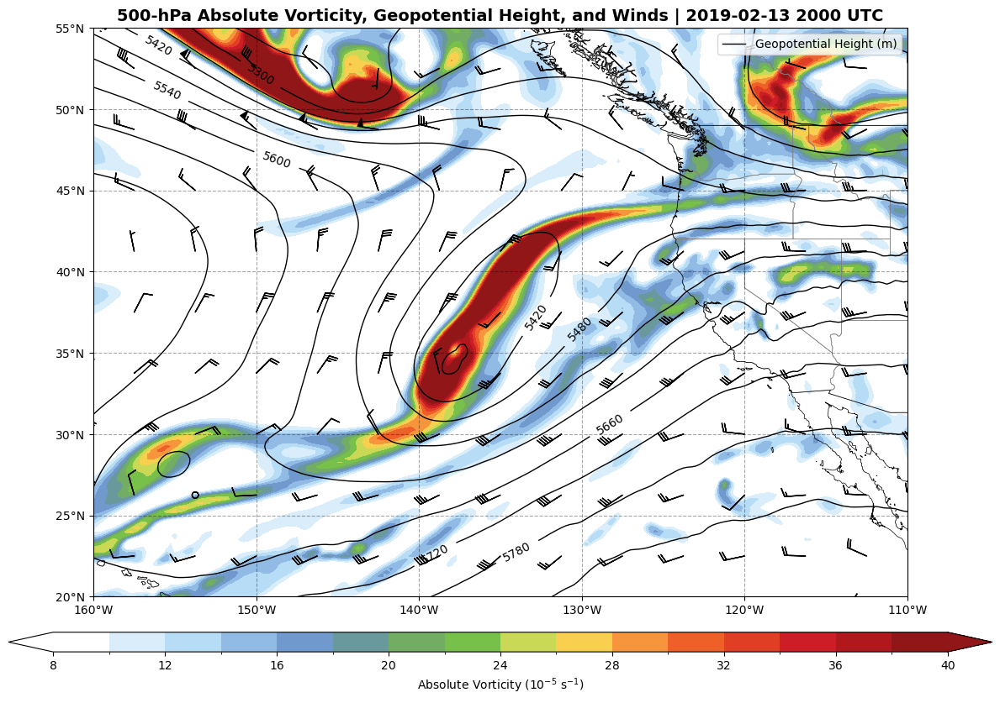

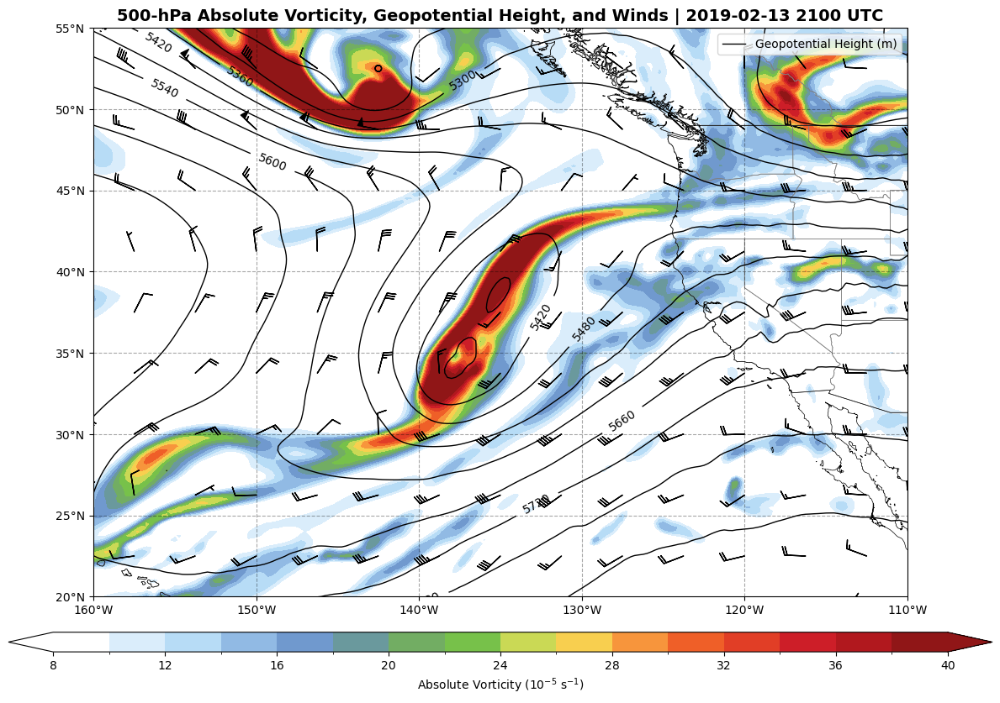

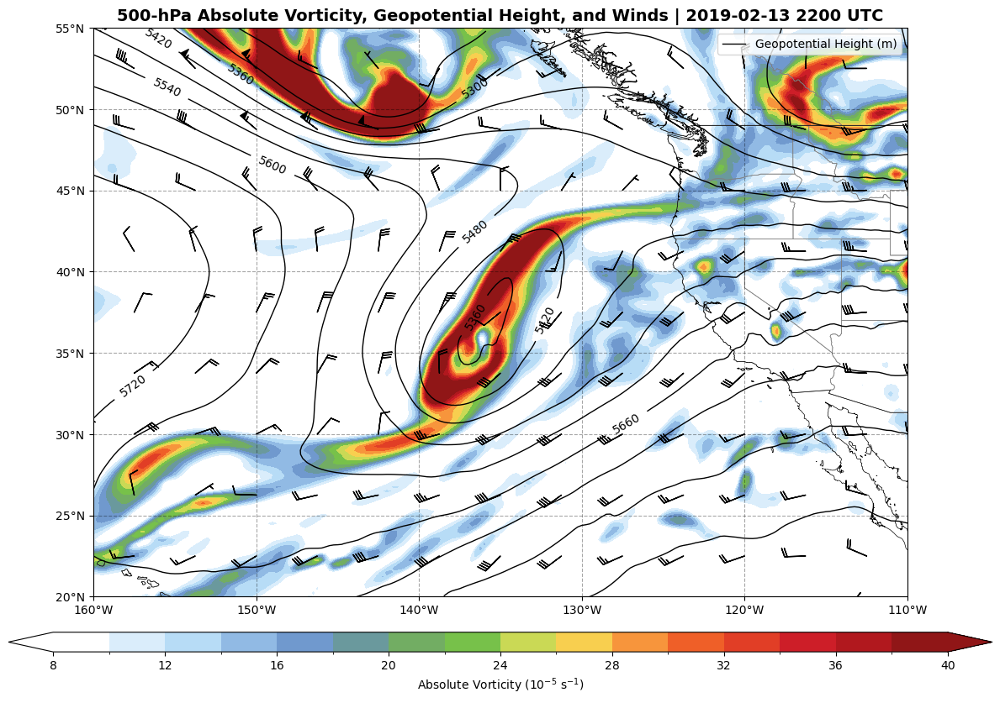

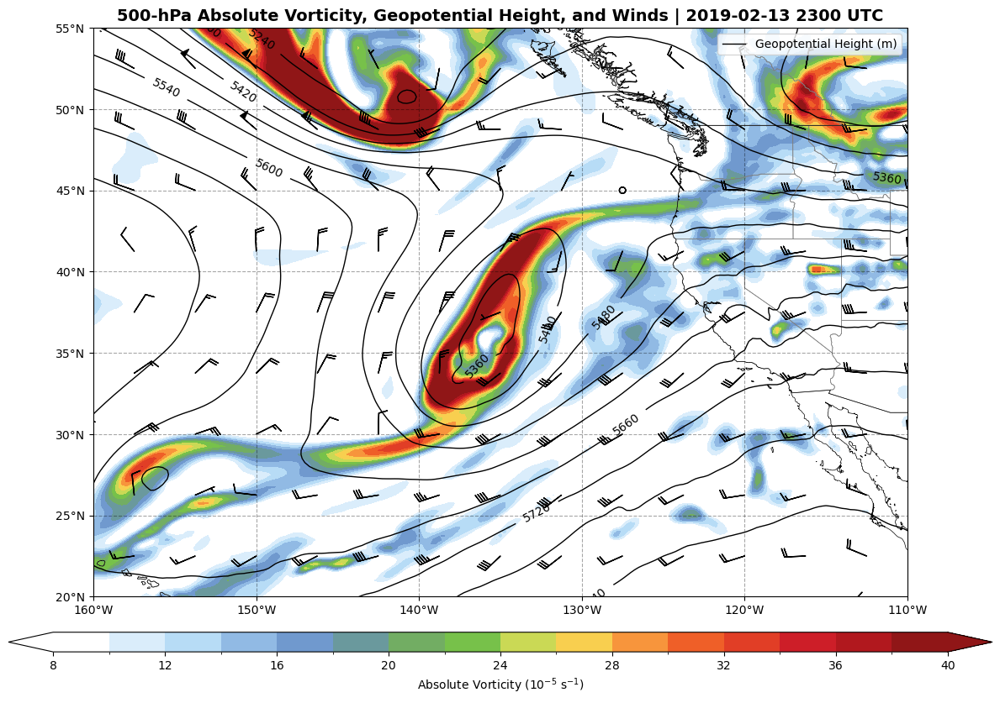

In [8]:
if __name__ == '__main__':
    year = 2019
    month = 2
    first_day = 13
    last_day = first_day
    directions = {'North': 55, 
                'East': 250, 
                'South': 20, 
                'West': 200} # units: degrees North, degrees East
    start_point = (30, 360 - 134) # units: degrees North, degrees East
    end_point = (36, 360 - 127) # units: degrees North, degrees East
    g = 9.81 # units: m/s^2
    level = 700 * units.hPa # units: hPa
    ds_pl, ds_sfc, ds_lsm = load_datasets(year=year, month=month, start_day=first_day, end_day=last_day, start_hour=0, end_hour=23)
    plot_absolute_vorticity(ds_pl=ds_pl, ds_sfc=ds_sfc, ds_lsm=ds_lsm, directions=directions, g=g)